In [1]:
import os
from huggingface_hub import snapshot_download

try:
    from kaggle_secrets import UserSecretsClient
    user_secrets = UserSecretsClient()
    HF_TOKEN = user_secrets.get_secret("HF_TOKEN")
    print("Successfully loaded HF_TOKEN from Kaggle Secrets.")
except ImportError:
    HF_TOKEN = os.getenv("HF_TOKEN")
    print("Kaggle Secrets not found. Using environment variable.")

os.environ["HF_TOKEN"] = HF_TOKEN

Successfully loaded HF_TOKEN from Kaggle Secrets.


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/517 [00:00<?, ?it/s]

experiment_2/cossacks_exp2-000035.safete(…):   0%|          | 0.00/228M [00:00<?, ?B/s]

Loading weights:   0%|          | 0/144 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/384 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

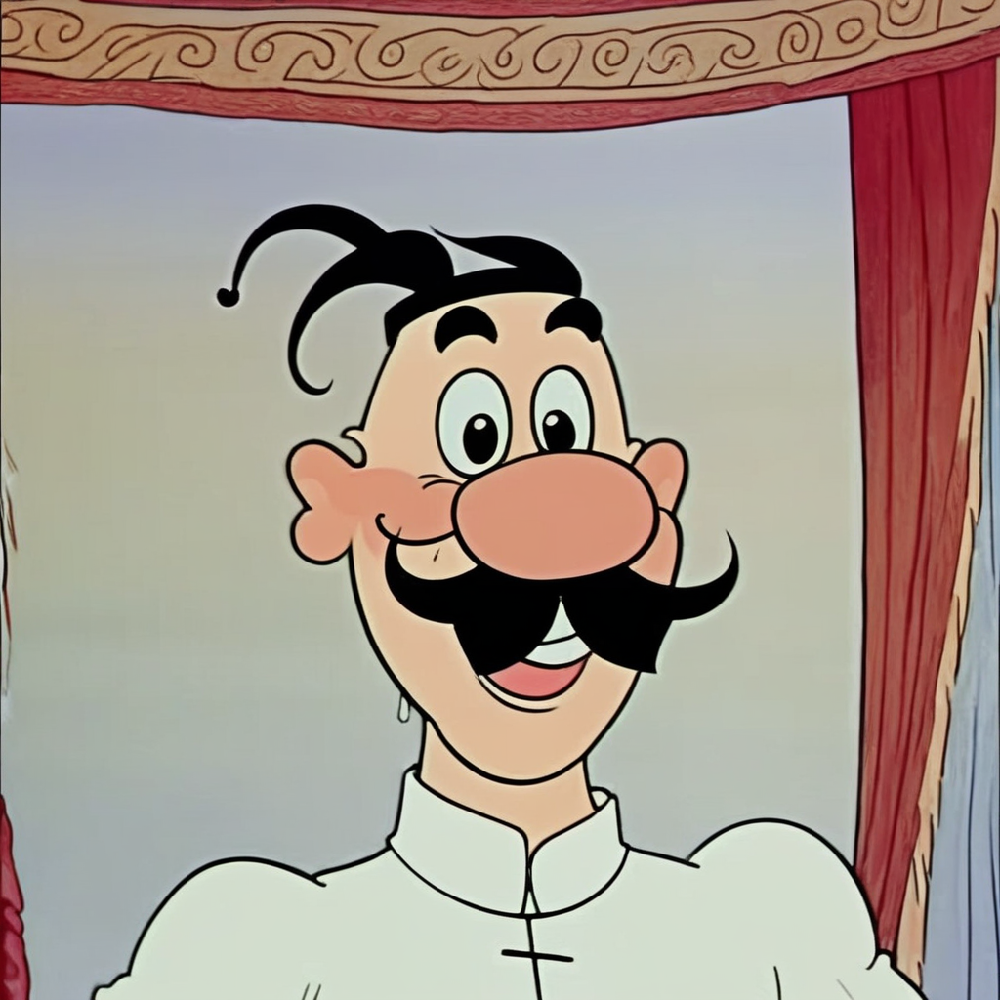

PROMPT: kzk style, close-up portrait of a joyful cossack, expressive friendly smile, large stylized eyes, thick black mustache and forelock, wearing a traditional white shirt, warm lighting, cozy comedic atmosphere, detailed clean lines
SEED: 7777
--------------------------------------------------------------------------------


  0%|          | 0/35 [00:00<?, ?it/s]

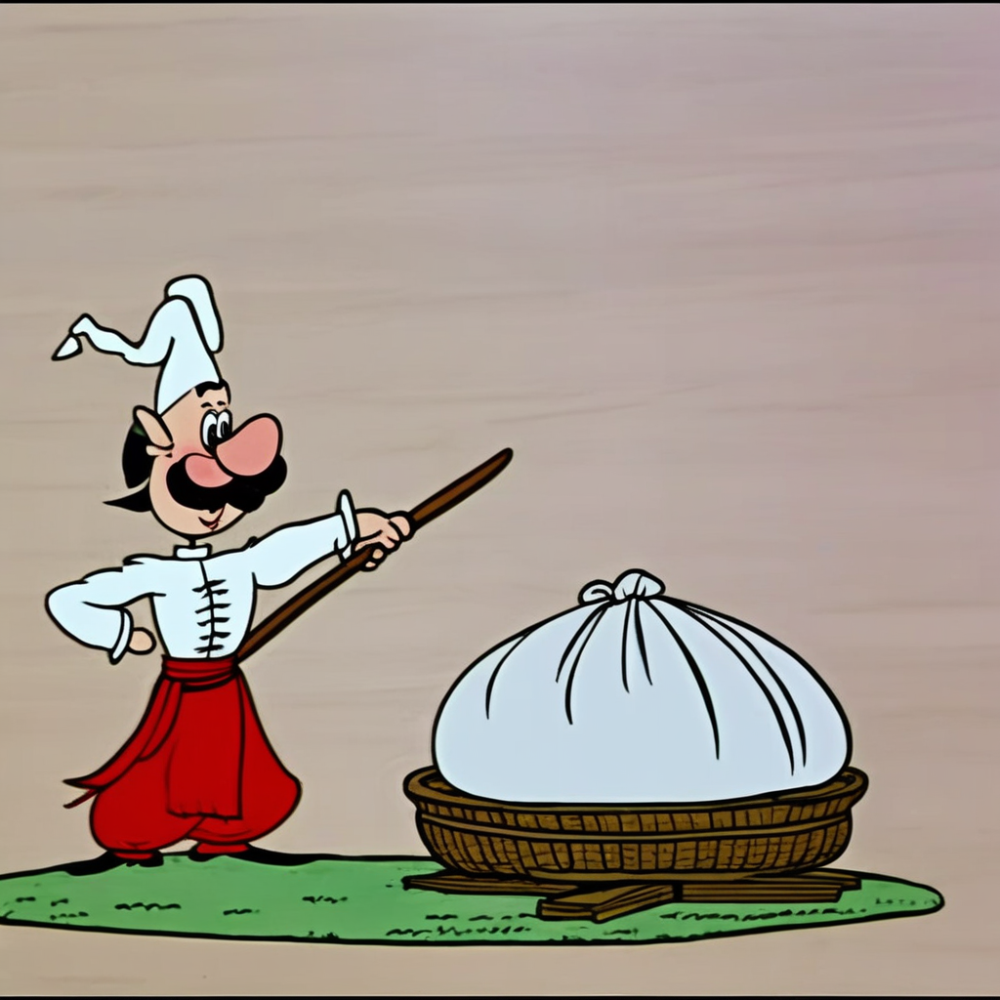

PROMPT: kzk style, happy broad-shouldered cossack proudly standing and holding a giant single steaming dumpling (varenyk) on a wooden fork, wearing wide red pants, plain white shirt, simple green steppe background, cheerful mood
SEED: 7792
--------------------------------------------------------------------------------


  0%|          | 0/35 [00:00<?, ?it/s]

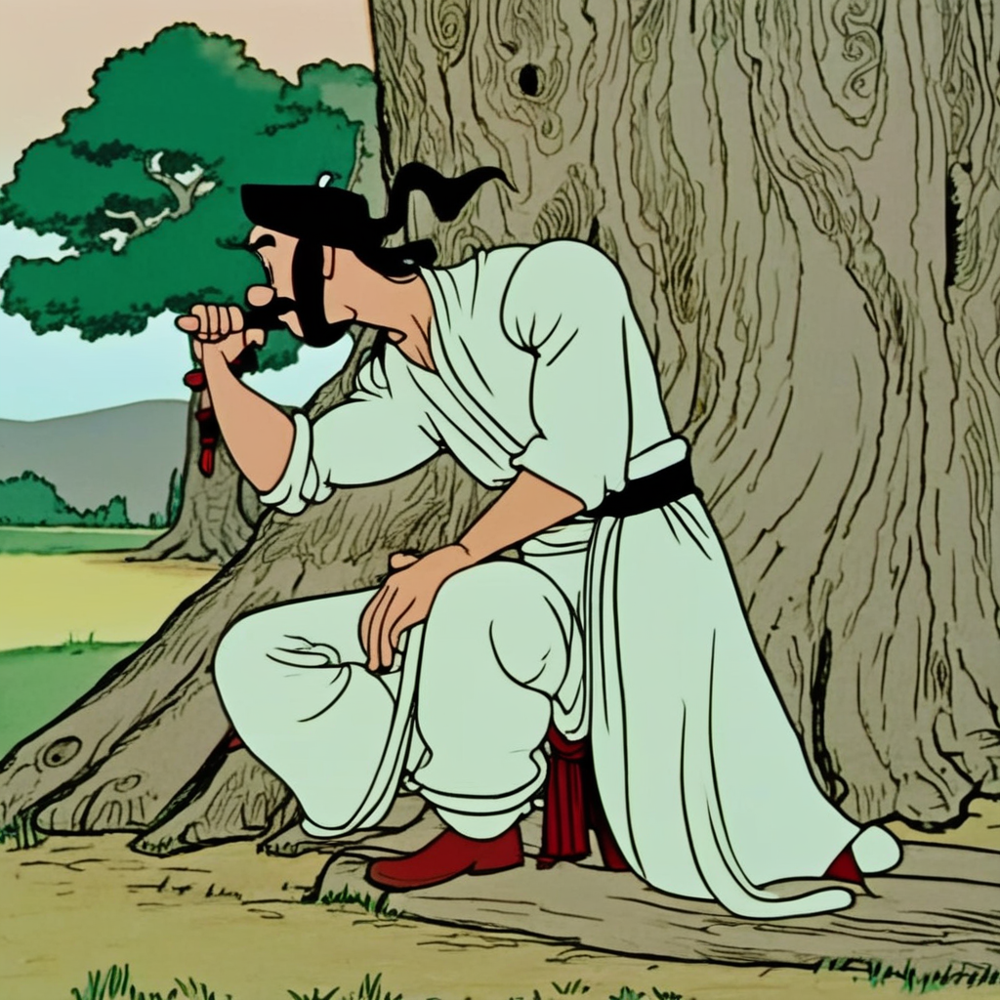

PROMPT: kzk style, a pensive friendly cossack sitting on a wooden log under a large oak tree in the golden steppe, leaning slightly, expressive detailed face, peaceful sunset lighting, loyal horse peacefully grazing in the distance
SEED: 7807
--------------------------------------------------------------------------------


  0%|          | 0/35 [00:00<?, ?it/s]

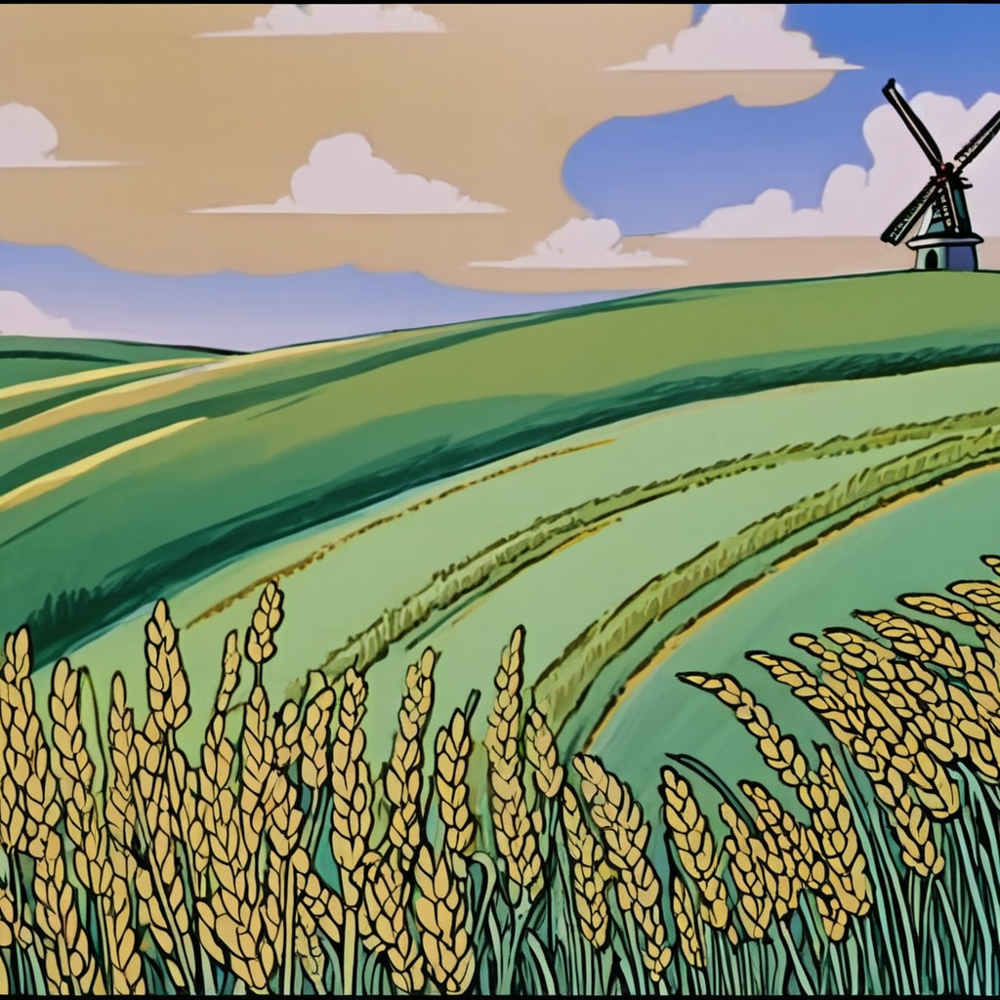

PROMPT: kzk style, a wide landscape of a golden wheat field waving in the wind under a bright blue sky with fluffy white clouds. A traditional wooden windmill stands on a distant green hill. Cinematic lighting, peaceful rural scenery, beautiful cel-shaded background
SEED: 7822
--------------------------------------------------------------------------------


  0%|          | 0/35 [00:00<?, ?it/s]

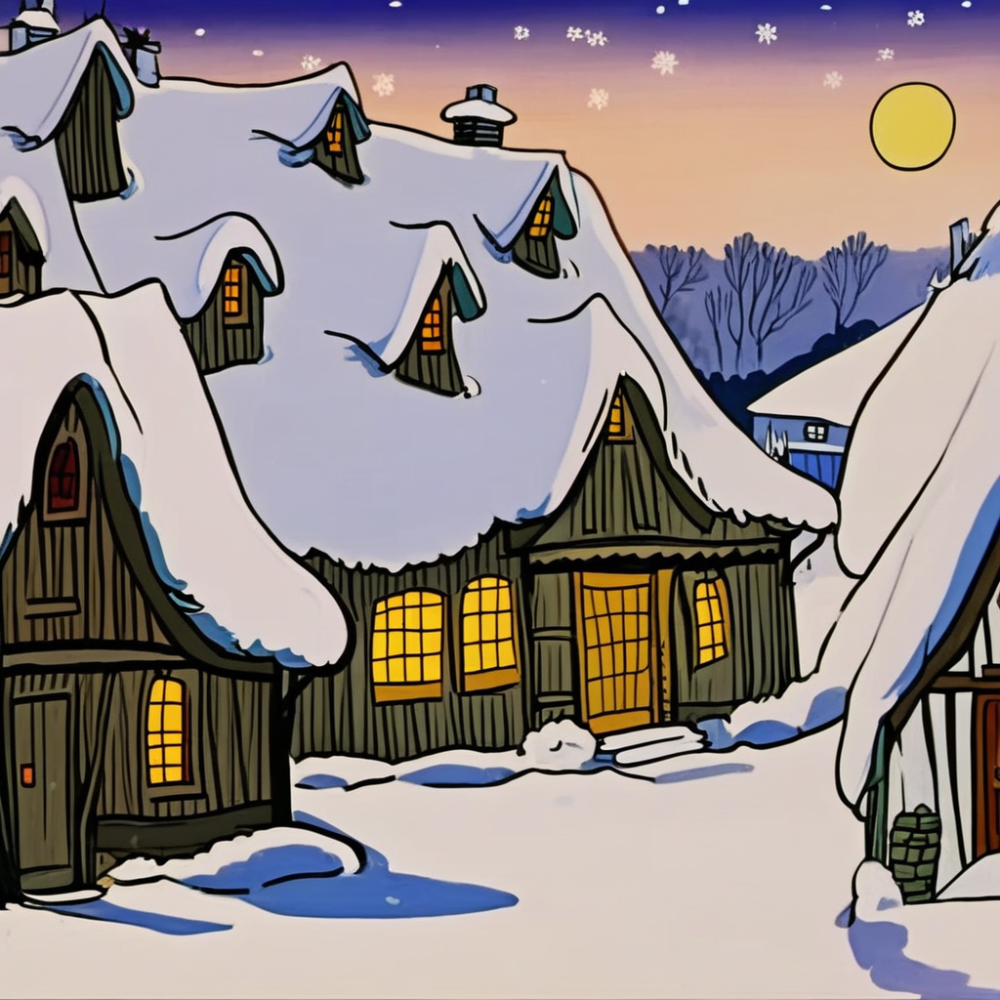

PROMPT: kzk style, a cozy ukrainian village covered in thick white snow during a winter night. Whitewashed huts with thatched roofs, warm yellow light glowing from the small windows. A full moon in the dark starry sky, magical snowy atmosphere
SEED: 7837
--------------------------------------------------------------------------------


  0%|          | 0/35 [00:00<?, ?it/s]

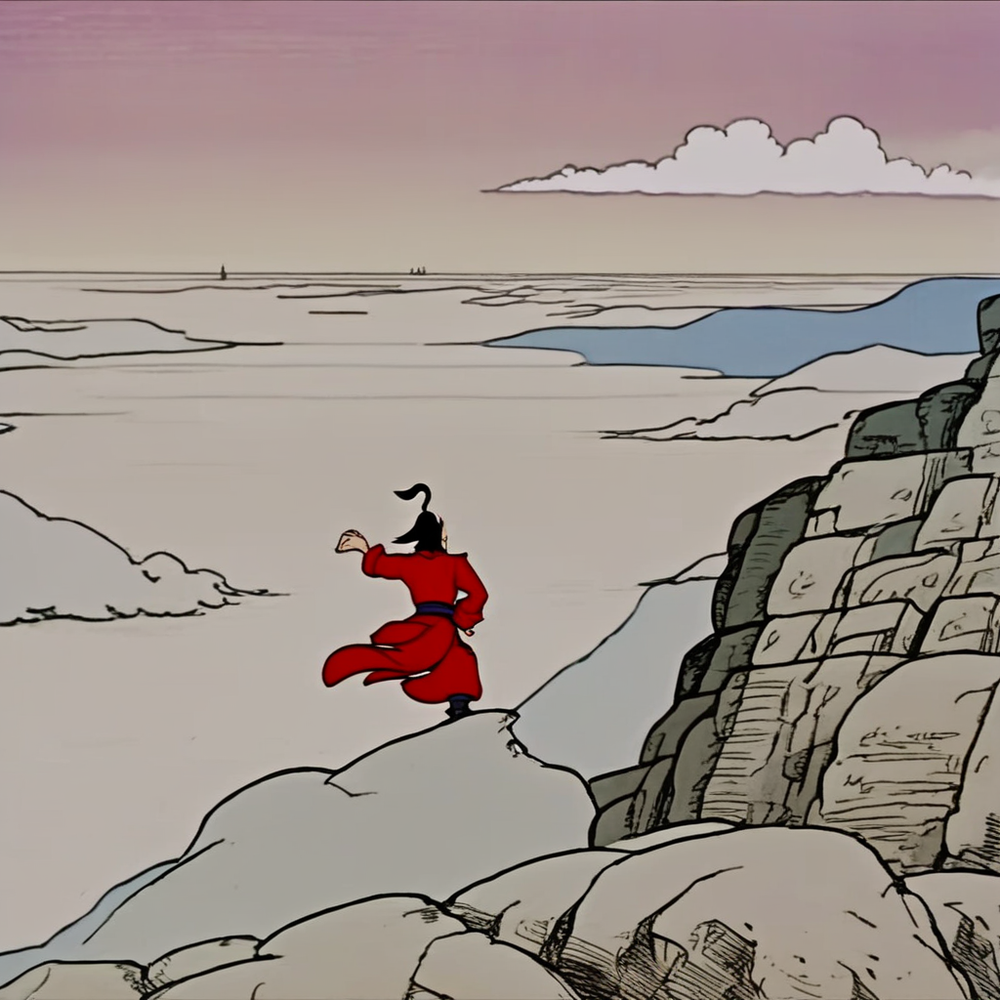

PROMPT: kzk style, an epic shot from behind of a broad-shouldered cossack standing on a high rocky cliff, looking out over the turbulent blue Black Sea. Strong wind blowing his wide red pants and forelock. Adventure, cinematic composition, majestic landscape
SEED: 7852
--------------------------------------------------------------------------------


  0%|          | 0/35 [00:00<?, ?it/s]

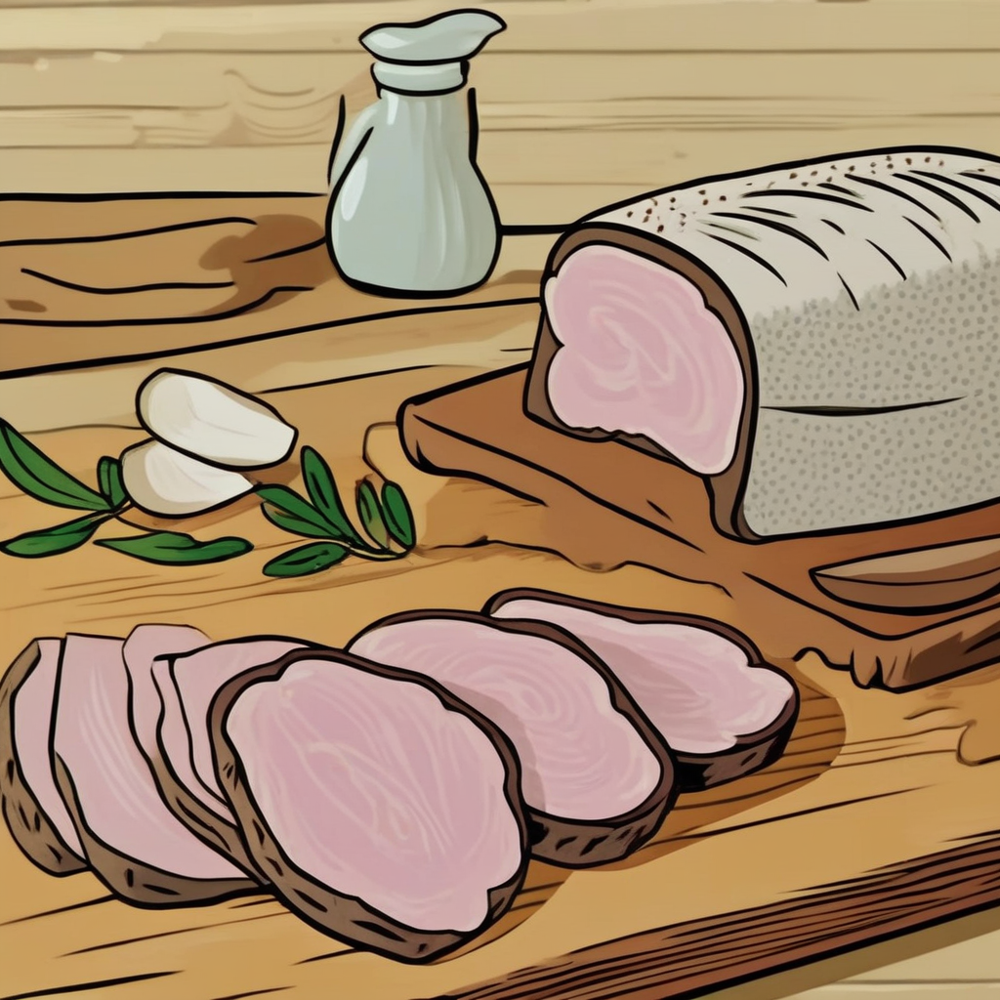

PROMPT: kzk style, close-up still life of traditional ukrainian food. A wooden cutting board with thick slices of salted pork fat (salo), cloves of fresh garlic, and a piece of dark rye bread. Rustic wooden table background, appetizing cel-shaded textures, detailed lineart
SEED: 7867
--------------------------------------------------------------------------------


  0%|          | 0/35 [00:00<?, ?it/s]

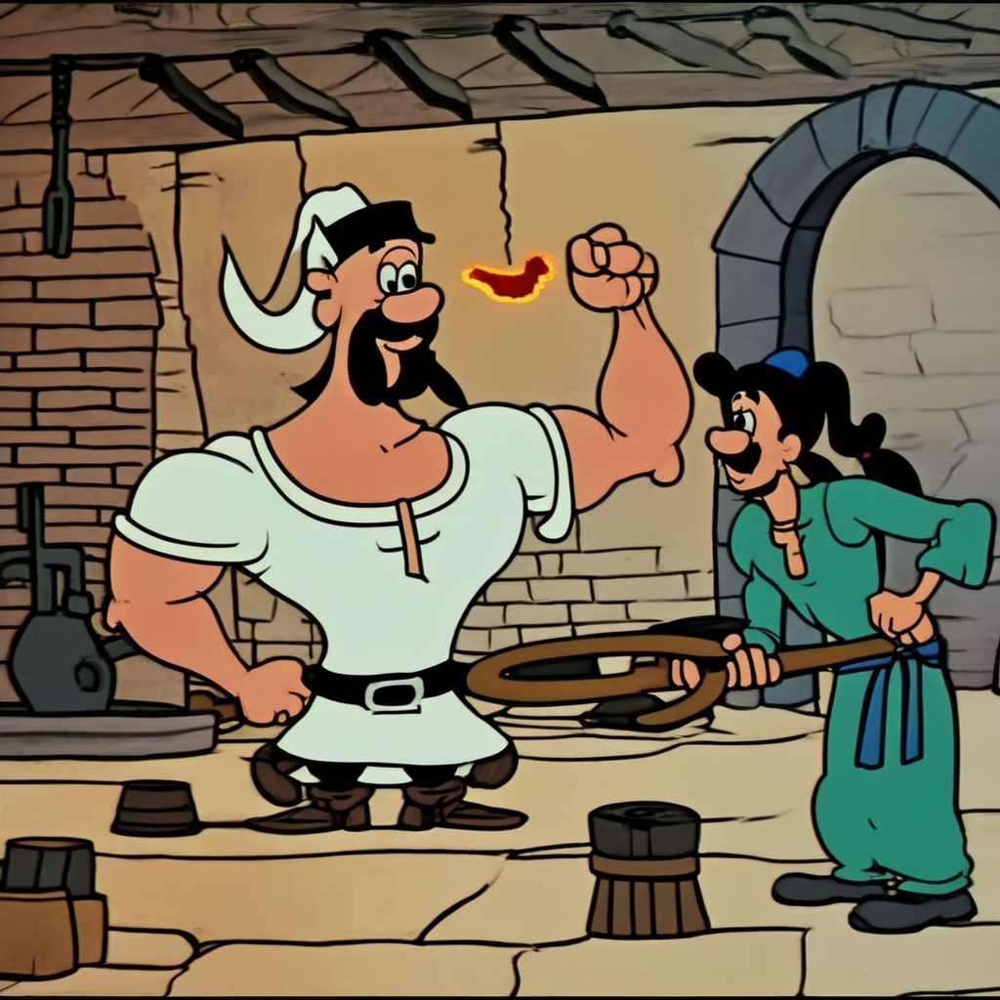

PROMPT: kzk style, inside a dimly lit traditional blacksmith workshop. A single muscular cossack blacksmith proudly holding a finished glowing horseshoe, friendly expression, glowing forge fire in the background, dramatic warm lighting, detailed texture
SEED: 7882
--------------------------------------------------------------------------------


  0%|          | 0/35 [00:00<?, ?it/s]

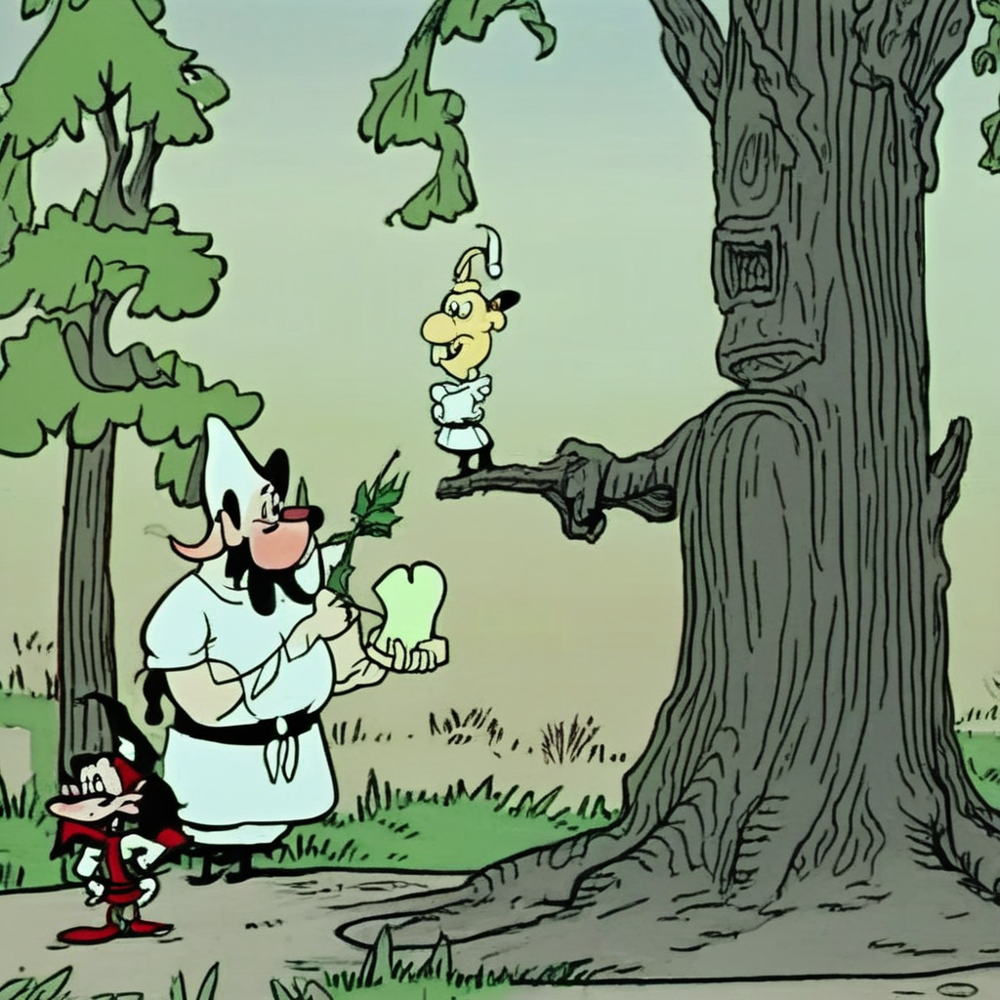

PROMPT: kzk style, a friendly scene of a brave cossack proudly showing a map to a small funny-looking furry forest demon (chort) sitting on a tree stump in the deep woods. Mysterious glowing mushrooms around them, detailed stylized foliage, humorous tone
SEED: 7897
--------------------------------------------------------------------------------


  0%|          | 0/35 [00:00<?, ?it/s]

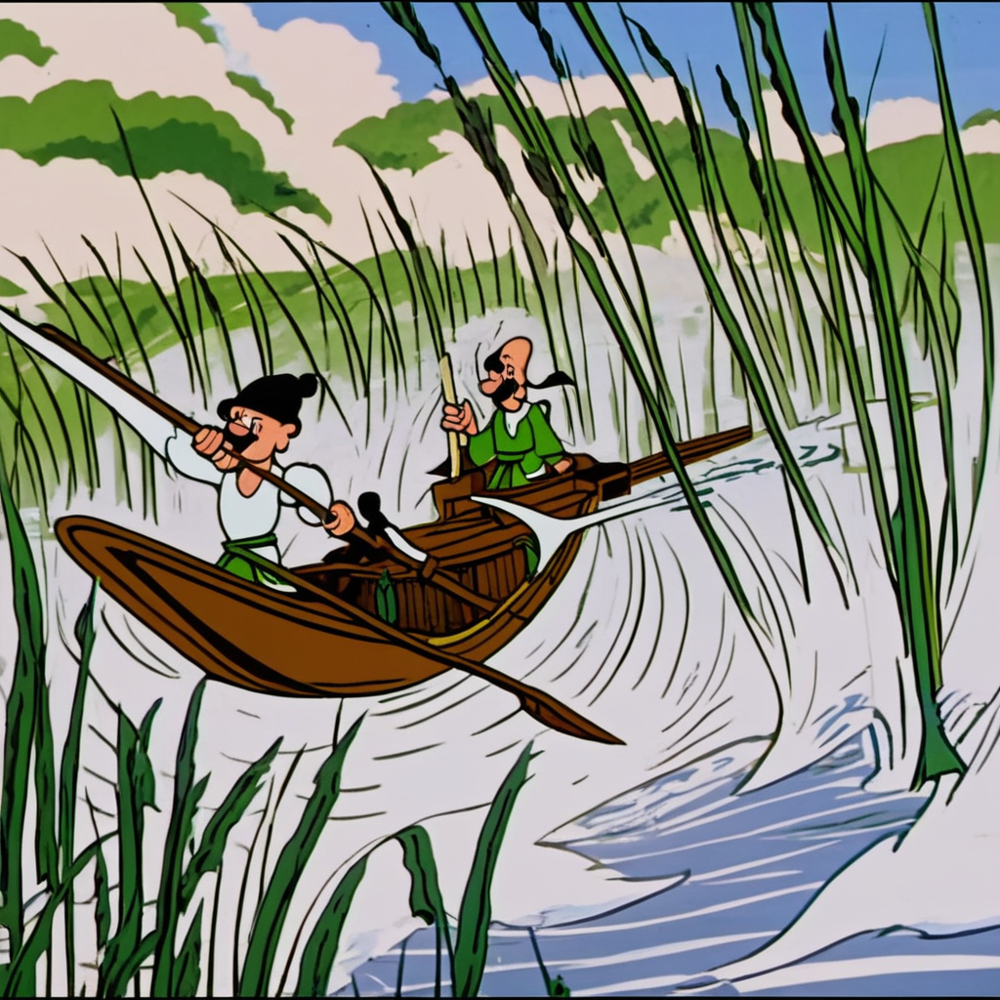

PROMPT: kzk style, dynamic first-person perspective from inside a wooden cossack boat (chaika) sailing on a river. Large stylized hands holding oars, water splashing. Green reeds on the riverbank in the background. Bright morning light
SEED: 7912
--------------------------------------------------------------------------------


In [3]:
import torch
from diffusers import StableDiffusionXLPipeline
from IPython.display import display, HTML
import gc

REPO_ID = "hannusia123123/cossacks-models"
SUBFOLDER = "experiment_2" 
WEIGHT_NAME = "cossacks_exp2-000035.safetensors"

prompts = [
    # Category 1: Portrait & Emotion
    "kzk style, close-up portrait of a joyful cossack, expressive friendly smile, large stylized eyes, thick black mustache and forelock, wearing a traditional white shirt, warm lighting, cozy comedic atmosphere, detailed clean lines",
    "kzk style, happy broad-shouldered cossack proudly standing and holding a giant single steaming dumpling (varenyk) on a wooden fork, wearing wide red pants, plain white shirt, simple green steppe background, cheerful mood",
    "kzk style, a pensive friendly cossack sitting on a wooden log under a large oak tree in the golden steppe, leaning slightly, expressive detailed face, peaceful sunset lighting, loyal horse peacefully grazing in the distance",
    
    # Category 2: Complex Environments & Landscapes
    "kzk style, a wide landscape of a golden wheat field waving in the wind under a bright blue sky with fluffy white clouds. A traditional wooden windmill stands on a distant green hill. Cinematic lighting, peaceful rural scenery, beautiful cel-shaded background",
    "kzk style, a cozy ukrainian village covered in thick white snow during a winter night. Whitewashed huts with thatched roofs, warm yellow light glowing from the small windows. A full moon in the dark starry sky, magical snowy atmosphere",
    "kzk style, an epic shot from behind of a broad-shouldered cossack standing on a high rocky cliff, looking out over the turbulent blue Black Sea. Strong wind blowing his wide red pants and forelock. Adventure, cinematic composition, majestic landscape",
    
    # Category 3: Objects & Interior
    "kzk style, close-up still life of traditional ukrainian food. A wooden cutting board with thick slices of salted pork fat (salo), cloves of fresh garlic, and a piece of dark rye bread. Rustic wooden table background, appetizing cel-shaded textures, detailed lineart",
    "kzk style, inside a dimly lit traditional blacksmith workshop. A single muscular cossack blacksmith proudly holding a finished glowing horseshoe, friendly expression, glowing forge fire in the background, dramatic warm lighting, detailed texture",
    
    # Category 4: Fantasy & Creative
    "kzk style, a friendly scene of a brave cossack proudly showing a map to a small funny-looking furry forest demon (chort) sitting on a tree stump in the deep woods. Mysterious glowing mushrooms around them, detailed stylized foliage, humorous tone",
    "kzk style, dynamic first-person perspective from inside a wooden cossack boat (chaika) sailing on a river. Large stylized hands holding oars, water splashing. Green reeds on the riverbank in the background. Bright morning light"
]

negative_prompt = "blurry eyes, distorted eyes, extra eyes, missing eyes, fused eyes, bad anatomy, deformed face, inhuman, realistic eyes, dead eyes, bad hands, floating limbs, messy composition, realistic lighting, overbaked style, photographic, 3d render"

pipe = StableDiffusionXLPipeline.from_pretrained(
    "stabilityai/stable-diffusion-xl-base-1.0",
    torch_dtype=torch.float16,
    variant="fp16",
    use_safetensors=True
)

pipe.enable_model_cpu_offload() 
pipe.enable_vae_slicing()       
pipe.load_lora_weights(REPO_ID, weight_name=WEIGHT_NAME, subfolder=SUBFOLDER)

BASE_SEED = 7777 

for idx, prompt in enumerate(prompts):
    current_seed = BASE_SEED + (idx * 15)
    
    generator = torch.Generator("cuda").manual_seed(current_seed)
    
    with torch.no_grad():
        image = pipe(
            prompt,
            negative_prompt=negative_prompt,
            num_inference_steps=35, 
            guidance_scale=7.5,
            cross_attention_kwargs={"scale": 1.0},
            generator=generator
        ).images[0]
    
    display(image)
    
    print(f"PROMPT: {prompt}")
    print(f"SEED: {current_seed}")
    print("-" * 80)
    
    gc.collect()
    torch.cuda.empty_cache()

pipe.unload_lora_weights()
del pipe
gc.collect()
torch.cuda.empty_cache()